In [1]:
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt

from skimage.color import rgb2gray, rgba2rgb
from skimage.feature import canny
from skimage.morphology import thin
from skimage.transform import resize

from scipy.signal import convolve2d

from imutils.perspective import four_point_transform

from mlp_train import detect_digit

import cv2
import math


%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
def loadImage(path):
    image = io.imread(path)
    
    if len(image.shape) == 4:
        image = rgba2rgb(image)
    
    if len(image.shape) > 2:
        image = (rgb2gray(image)*255).astype('uint8')
    else:
        image = (image).astype('uint8')
    return image

# Show the figures / plots inside the notebook
def show_images(images,titles=None):
    #This function is used to show image(s) with titles by sending an array of images and an array of associated titles.
    # images[0] will be drawn with the title titles[0] if exists
    # You aren't required to understand this function, use it as-is.
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images,titles):
        a = fig.add_subplot(1,n_ims,n)
        if image.ndim == 2: 
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show()  


def perspective_correction(image):
    def findContours1():
        gray = np.uint8(rgb2gray(image.copy())*255)
        _,binary = cv2.threshold(gray,125,255,cv2.THRESH_BINARY)
        cnts = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0] if len(cnts)==2 else cnts[1]
        #fig = plt.figure(figsize=(15, 15))
        #plt.gray()
        #plt.imshow(binary)
        return cnts

    def findContours2():
        gray = np.uint8(rgb2gray(image.copy())*255)
        edged = np.uint8(canny(gray,sigma=4))
        cnts = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0] if len(cnts)==2 else cnts[1]
        #fig = plt.figure(figsize=(15, 15))
        #plt.gray()
        #plt.imshow(edged)
        return cnts
    
    
    getContours = [findContours2, findContours1]
    for Contours in getContours:
        cnts = Contours()
        
        if len(cnts) > 0:
            cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
            for c in cnts:
                peri = cv2.arcLength(c, True)
                approx = cv2.approxPolyDP(c, 0.02 * peri, True)
                # if our approximated contour has four points,
                # then we can assume we have found the paper
                if len(approx) == 4:
                    x,y = image.shape[:2]
                    if peri > (x+y)*2/4: 
                        #checking if contour length is bigger than the original image's length/8
                        paper = four_point_transform(image, approx.reshape(4, 2))
                        return paper, True

    return image, False


def removeShadow(img):
    rgb_planes = cv2.split(img)

    result_planes = []
    result_norm_planes = []
    for plane in rgb_planes:
        dilated_img = cv2.dilate(plane, np.ones((7,7), np.uint8))
        bg_img = cv2.medianBlur(dilated_img, 21)
        diff_img = 255 - cv2.absdiff(plane, bg_img)
        norm_img = cv2.normalize(diff_img,None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
        result_planes.append(diff_img)
        result_norm_planes.append(norm_img)

    result = cv2.merge(result_planes)
    result_norm = cv2.merge(result_norm_planes)
    return result

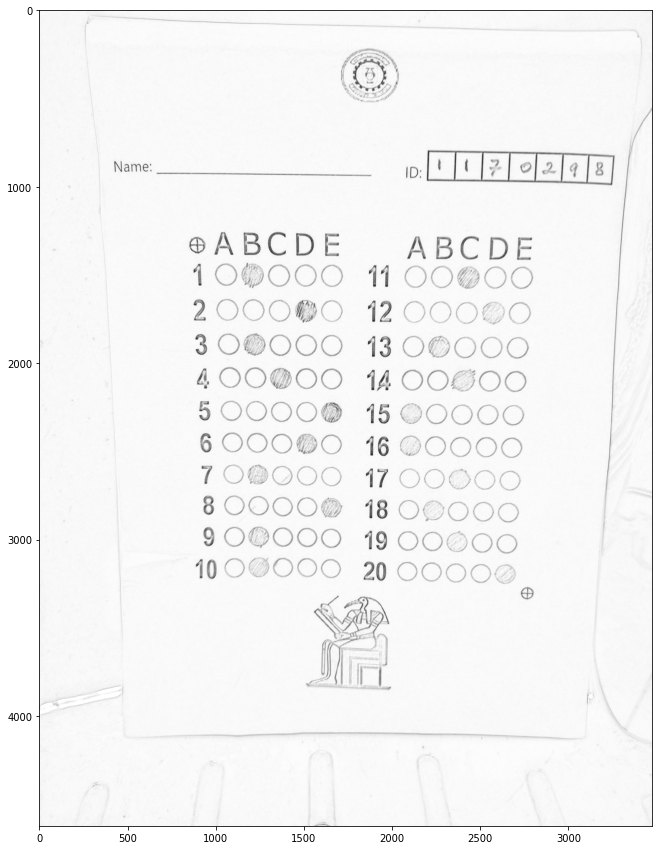

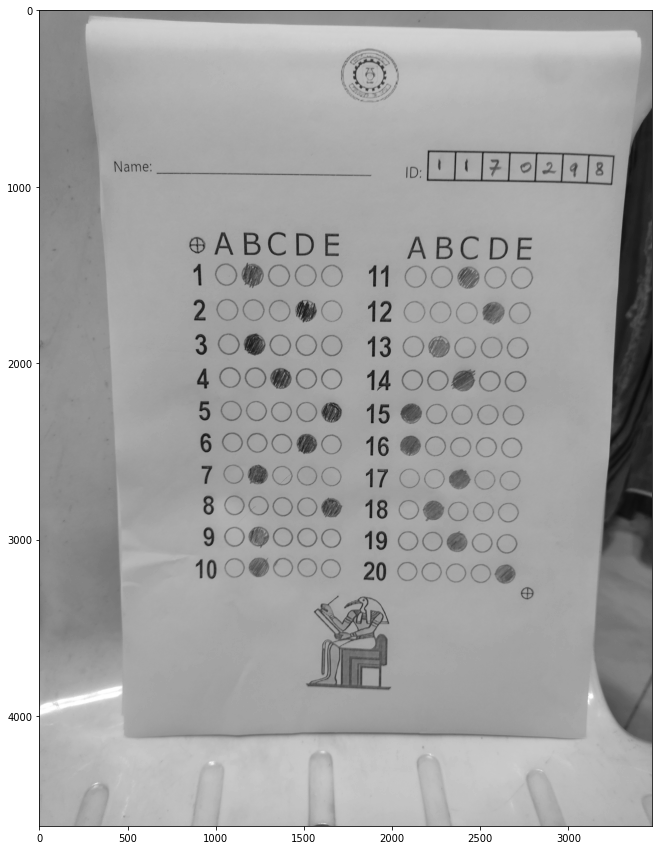

In [3]:
image = loadImage('1.jpg')
fig = plt.figure(figsize=(15, 15))
plt.gray()
plt.imshow(removeShadow(image))

fig = plt.figure(figsize=(15, 15))
plt.gray()
plt.imshow(image)

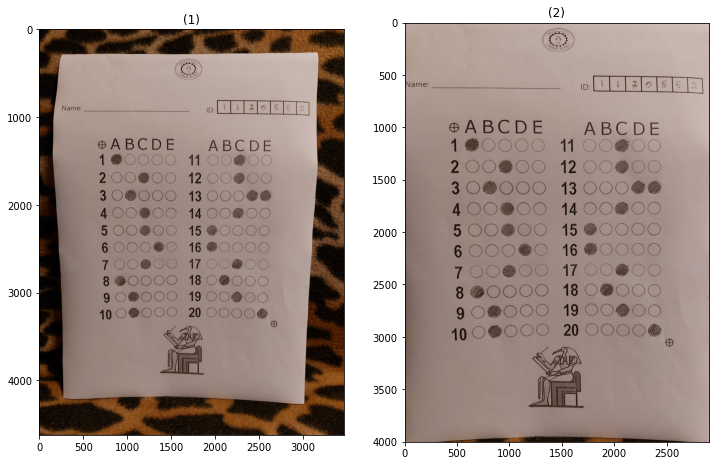

In [4]:
pap1 = io.imread('solved_images/3.jpg')

#plt.figure(figsize=(25, 25))
#plt.imshow(pap)

pap2, flag = perspective_correction(pap1)

show_images([pap1, pap2])
#if flag:
#    plt.figure(figsize=(15, 15))
#    plt.imshow(pap);

In [46]:
def get_id(img, id_length=7, show_info=False, correct_perspective = False):
    
    if correct_perspective:
        image,_ = perspective_correction(img.copy())
    else: 
        image = img.copy()
        
    image = image[image.shape[0]//16:image.shape[0]//4,image.shape[1]//2:]
    image = removeShadow(image)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.medianBlur(gray, 5)

    _,binary = cv2.threshold(gray,235,255,cv2.THRESH_BINARY)
    contours,_ = cv2.findContours(binary,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
        
    if show_info: print("Number of contours:" + str(len(contours)))
        
    data = []
    data_i = []
    data_temp=[]
    for i,c in enumerate(contours):
        x,y,w,h = cv2.boundingRect(c)
        #if w > image.shape[0]/8 or h > image.shape[1]/8: #if very large contour 
        #    continue
        if w/h<0.8 or w/h>1.2: # if rec is not a square
            continue
        if cv2.contourArea(c) < 300: # if the square is so small
            continue
            
        cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)
        data.append((y,y+h,x,x+w))

    if show_info: print("Number of contours:" + str(len(data)))
        
    id_str = id_length*'0'
    if len(data) >= id_length:
        # To take the bigger 7 squares in the image, to avoid the logo's detection and digits
        data.sort(key=lambda x: (x[1]-x[0])*(x[3]-x[2]), reverse=True)
        data = data[:id_length]
        data.sort(key=lambda x: x[2])
        ###
  
        for i,(y1,y2,x1,x2) in enumerate(data):
            im = resize(np.invert(binary[y1:y2,x1:x2].copy()),(32,32))
            im = im[2:-2,2:-2]
            data_temp.append(cropDigit(im,padding=4))
            data_i.append(im) 

        id_str = ''
        for i in range(id_length):
            p = detect_digit(data_temp[i], plot=False)
            id_str += str(p)

    if show_info: 
        plt.figure(figsize=(15, 15))
        plt.imshow(image)
        plt.title('image');

        show_images(data_temp)
        show_images(data_i)
        
    return id_str
    

In [41]:
def cropDigit(img,padding=3):
    im = img.copy()
    im = im > 100/255
    y,x = im.shape
    
    flag = False
    for i in range(y):
        for j in range(x):
            if im[i][j]!=0:
                flag=True; break
        if flag: break
    y_upper = i
    
    flag = False
    for i in range(y-1,0,-1):
        for j in range(x):
            if im[i][j]!=0:
                flag=True; break
        if flag: break
    y_lower = y-i
    
    flag = False
    for j in range(x):
        for i in range(y):
            if im[i][j]!=0:
                flag=True; break
        if flag: break
    x_left = j
    
    flag = False
    for j in range(x-1,0,-1):
        for i in range(y):
            if im[i][j]!=0:
                flag=True; break
        if flag: break
    x_right = x-j
        
    maxy,miny = max(y_upper,y_lower), min(y_upper,y_lower)
    maxy_i = 0 if y_upper>y_lower else 1
    maxx,minx = max(x_left,x_right), min(x_left,x_right)
    maxx_i = 0 if x_left>x_right else 1
    
    im = img.copy()
    
    shift_right = np.array([
    [ 0, 0, 0],
    [ 0, 0, 1],
    [ 0, 0, 0]
    ])
    shift_left = np.array([
    [ 0, 0, 0],
    [ 1, 0, 0],
    [ 0, 0, 0]
    ])
    
    if x_left > x_right:
        for _ in range((x_left-x_right)//2): 
            im = convolve2d(im, shift_left)
            im = im[1:-1,1:-1]
            x_left-=1
            x_right+=1
    elif x_right > x_left:
        for _ in range((x_right-x_left)//2): 
            im = convolve2d(im, shift_right)
            im = im[1:-1,1:-1]
            x_left+=1
            x_right-=1
                
    x_left = (maxy+miny)//2
    x_right = (maxy+miny)//2
            
    y_upper = y_upper - padding if y_upper>padding else 0
    y_lower = y_lower - padding if y_lower>padding else 1
    x_left = x_left - padding if x_left>padding else 0
    x_right = x_right - padding if x_right>padding else 1
        
    return resize(im[y_upper:-y_lower,x_left:-x_right],(28,28)) 

(28, 28)


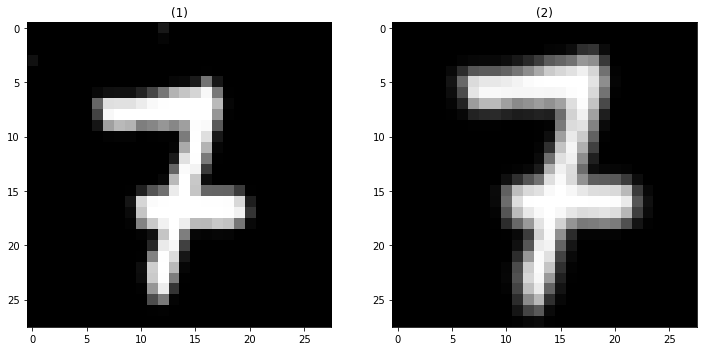

In [45]:
index = 2
print(data_tt[index].shape)
cd = cropDigit(data_tt[index],padding=2)
show_images([data_tt[index], cd])

In [ ]:
data_tt = data_i.copy()

In [ ]:
#data_ii = data_i.copy()

for i in range(7):
    data_tt[i] = data_ii[i]>100/255
show_images(data_i)
show_images(data_ii)

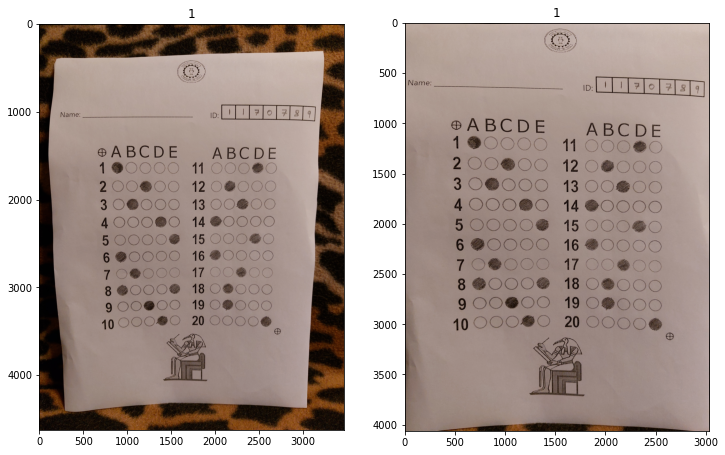

Number of contours:226
Number of contours:8


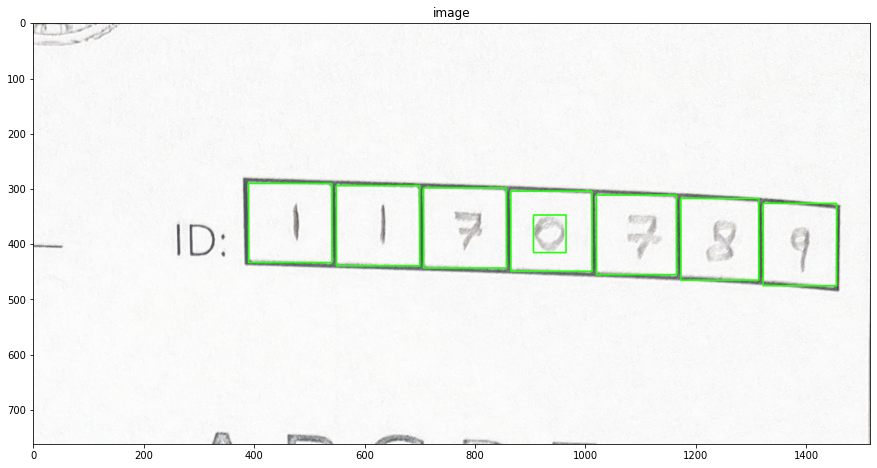

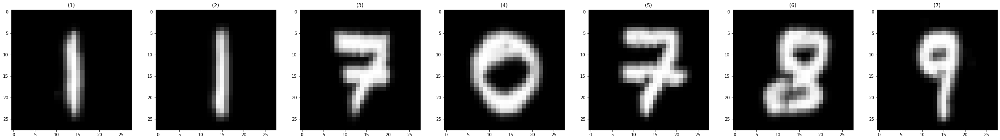

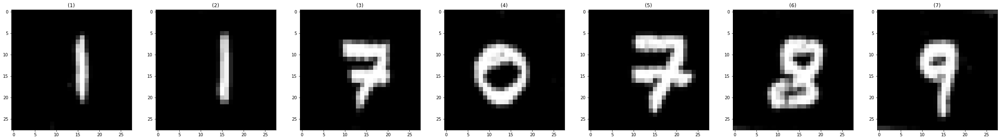

1170789


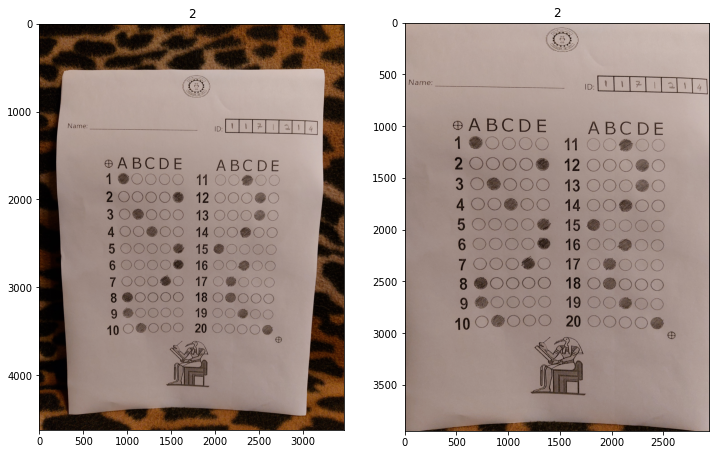

Number of contours:285
Number of contours:10


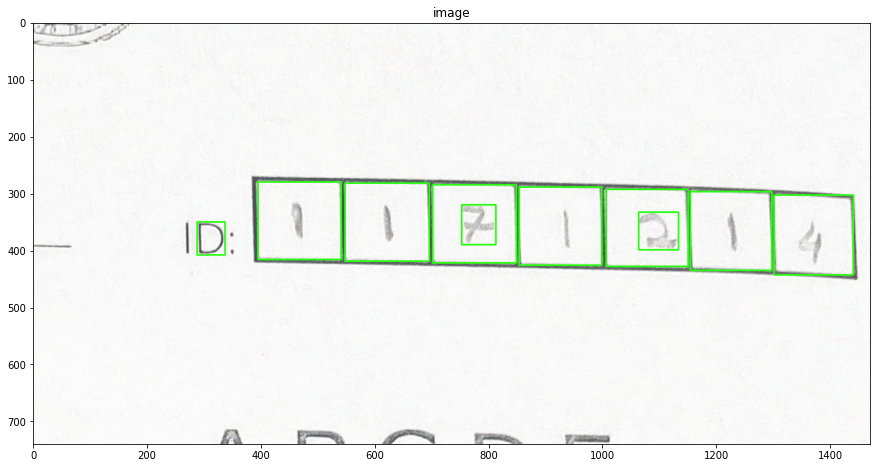

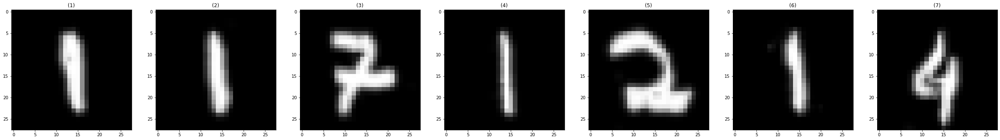

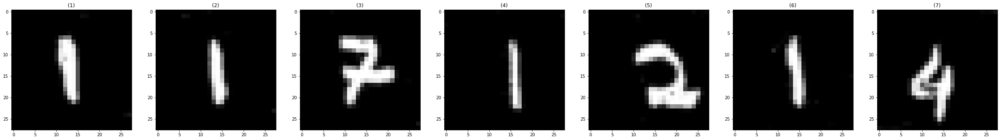

1171214


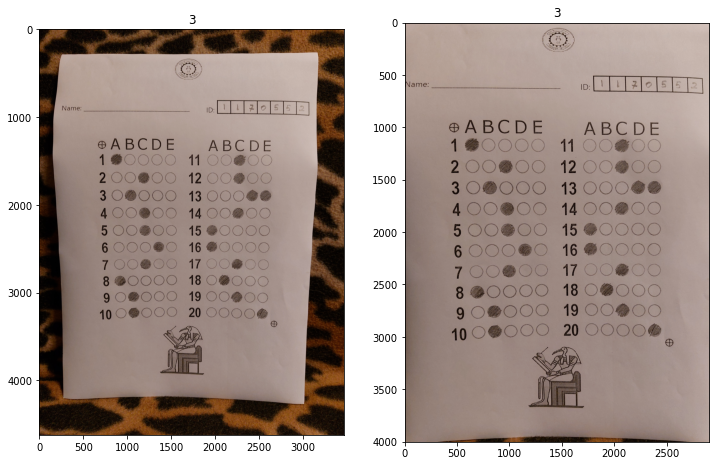

Number of contours:379
Number of contours:10


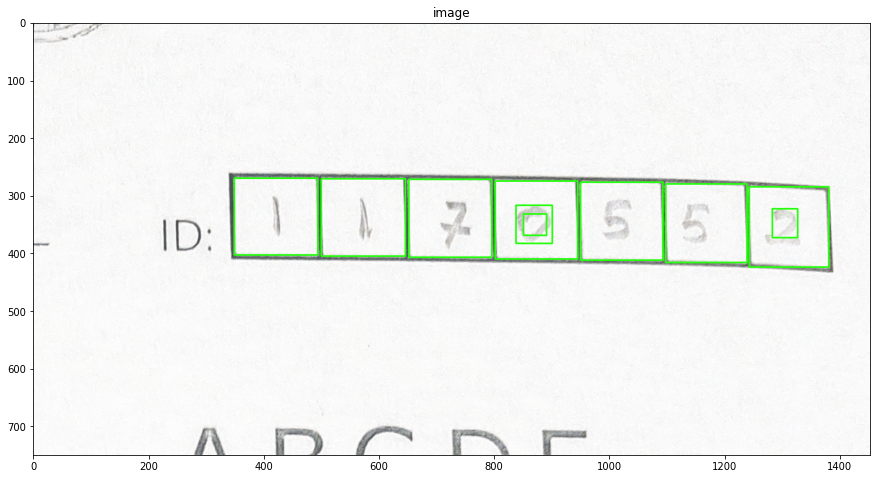

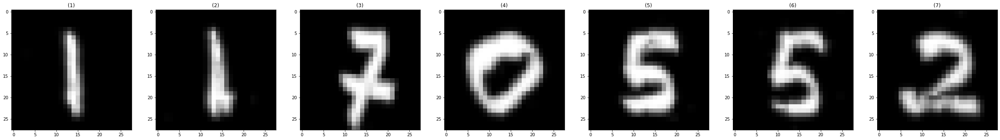

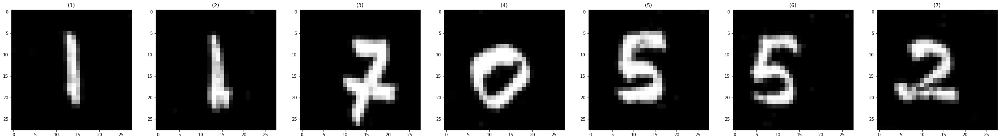

1170552


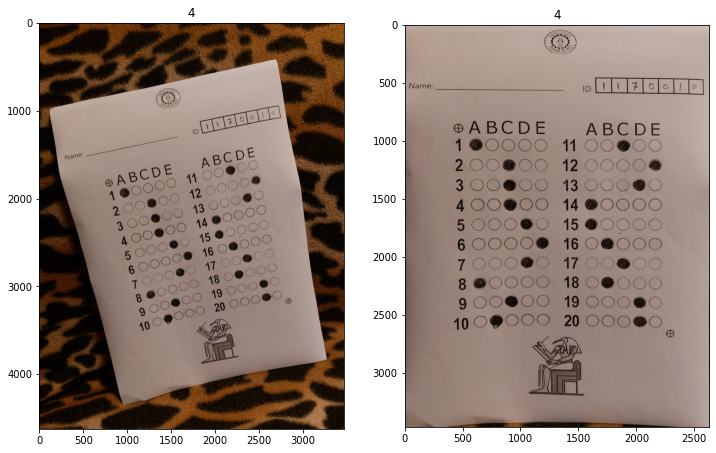

Number of contours:74
Number of contours:11


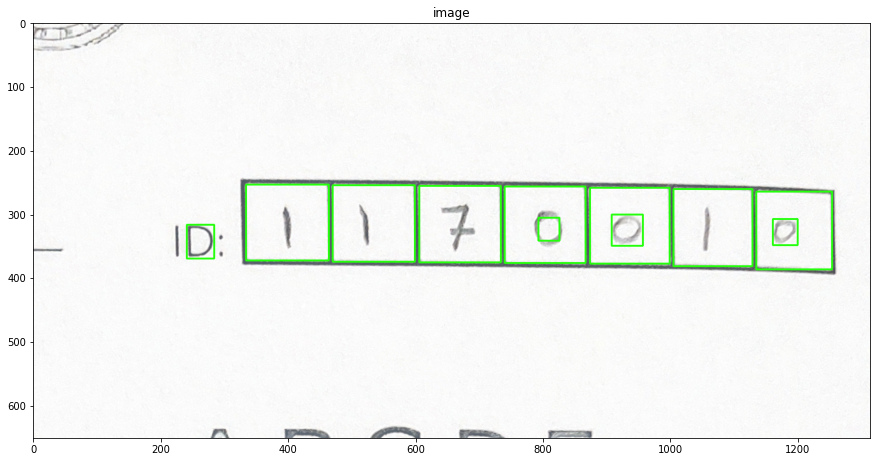

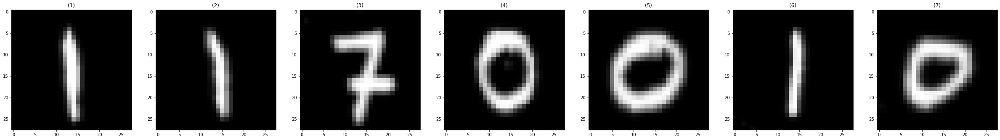

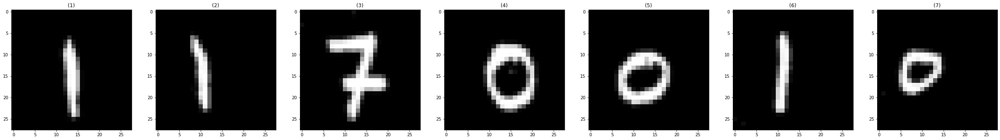

1170010


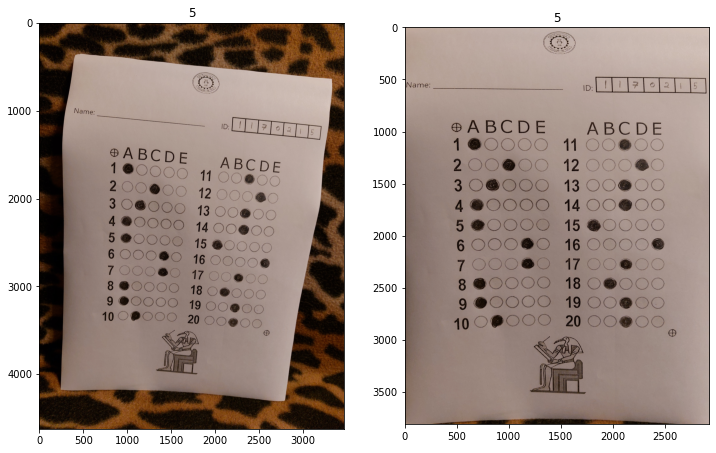

Number of contours:78
Number of contours:11


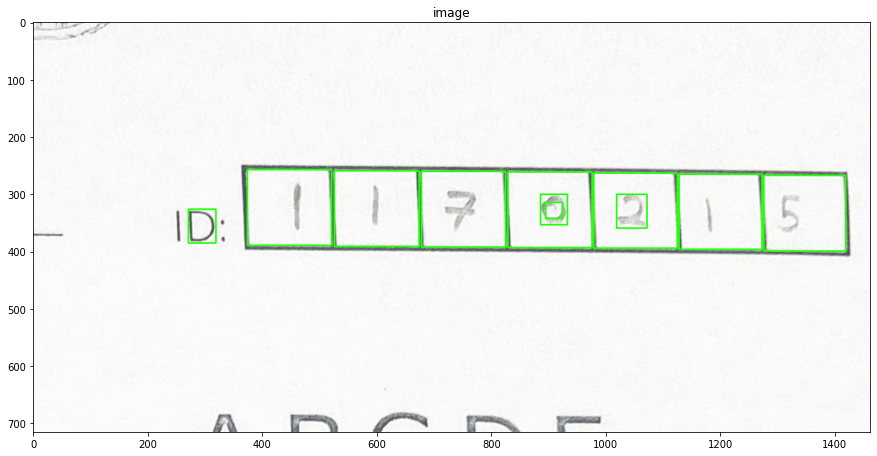

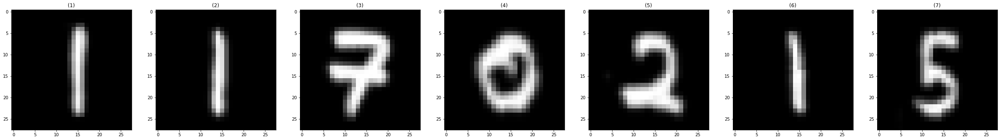

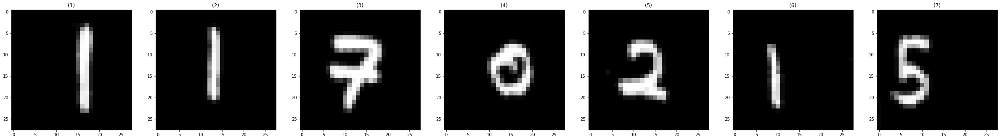

1170215


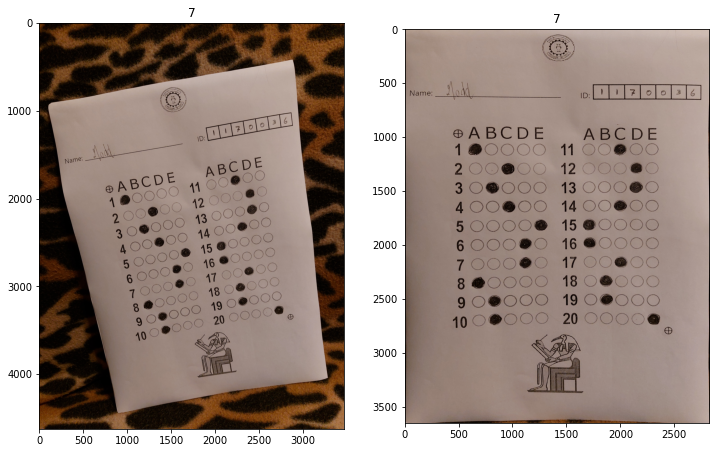

Number of contours:95
Number of contours:12


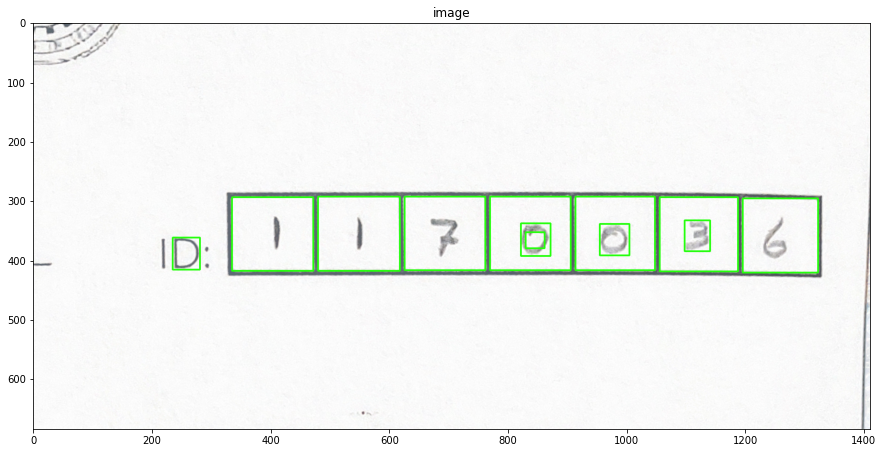

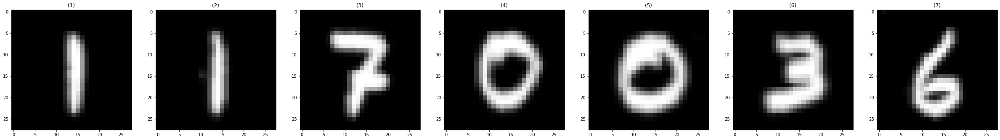

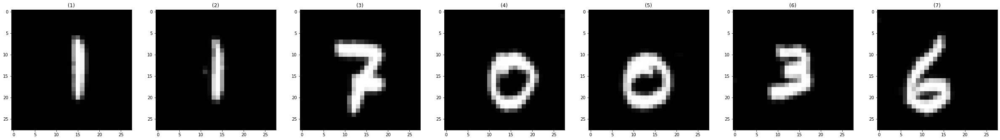

1170036


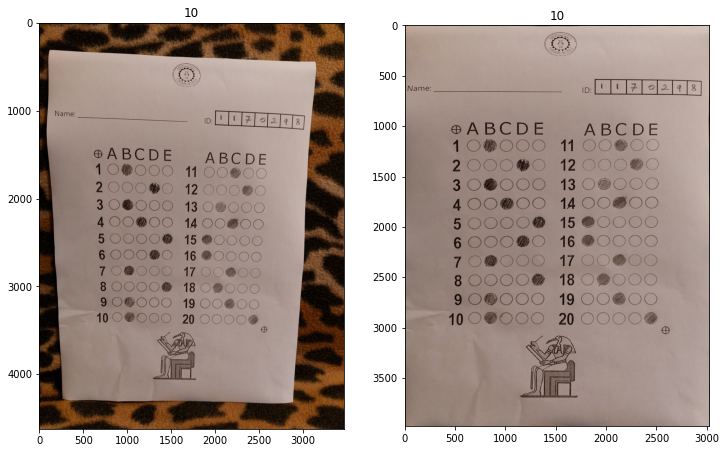

Number of contours:325
Number of contours:10


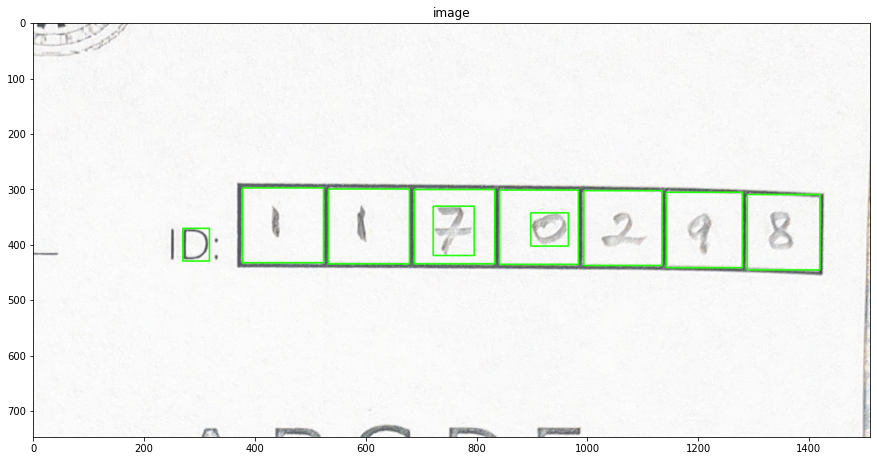

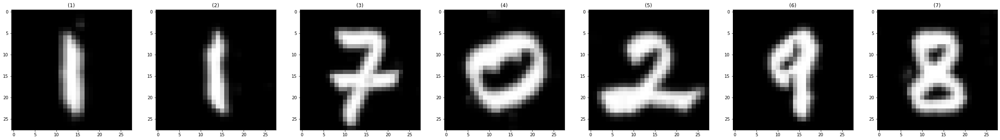

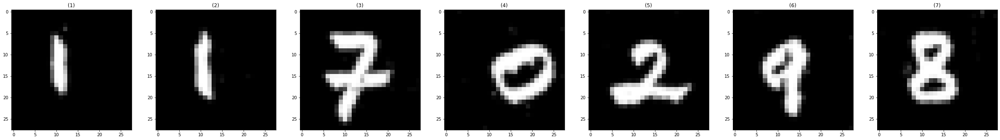

1170298


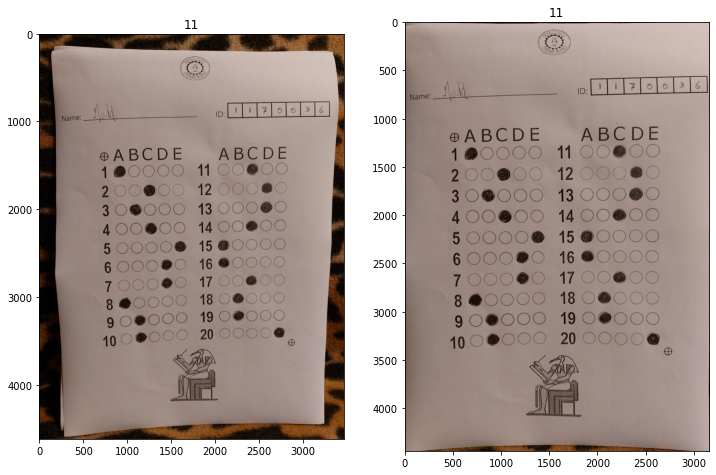

Number of contours:698
Number of contours:11


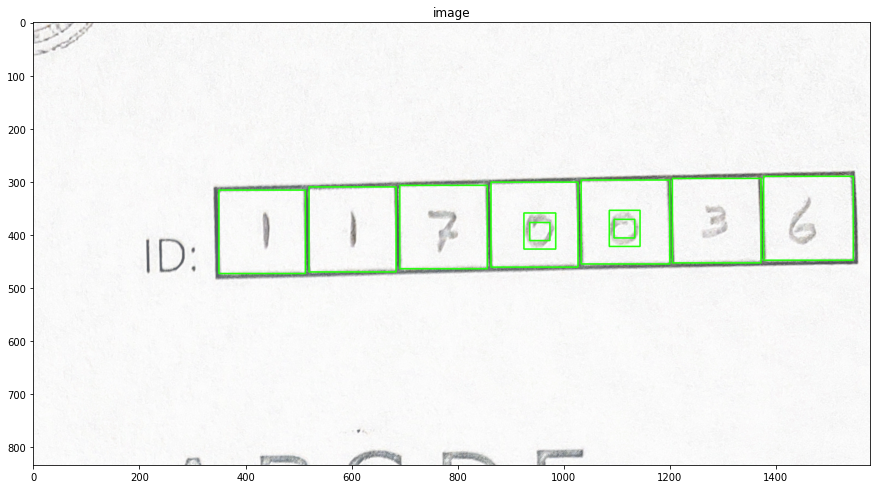

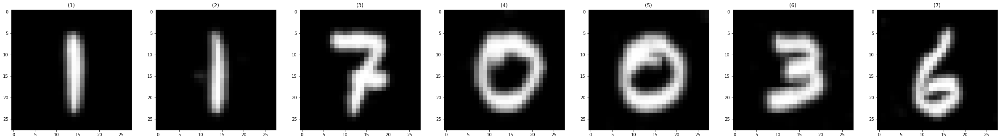

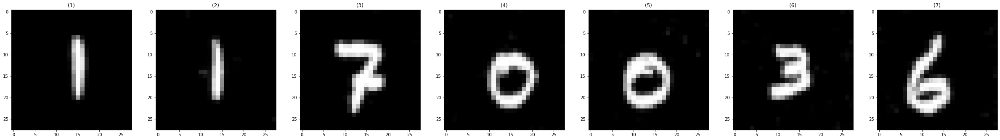

1170036


In [47]:
ii = [1,2,3,4,5,7,10,11]

for i in ii:
    pap1 = io.imread('solved_images/'+str(i)+'.jpg')
    pap2, flag = perspective_correction(pap1)
    show_images([pap1, pap2],[i,i])
    if flag:
        idd = get_id(pap2, id_length=7, show_info=True, correct_perspective = False)
        print(idd)

Number of contours:74
Number of contours:11


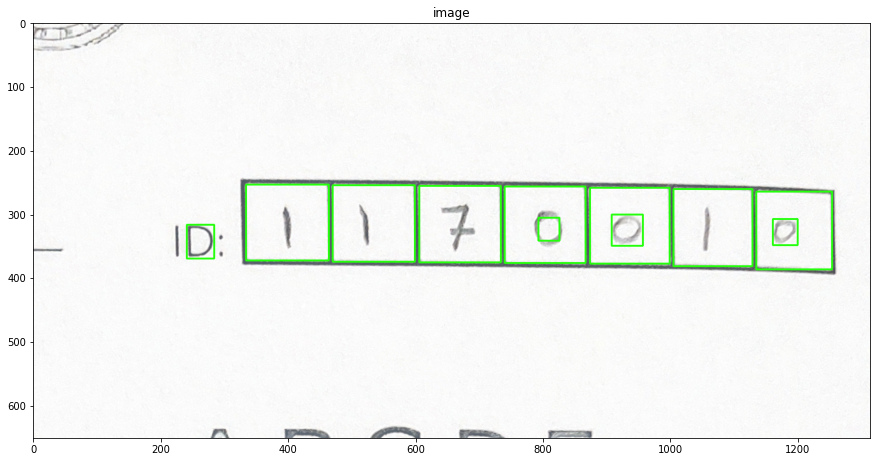

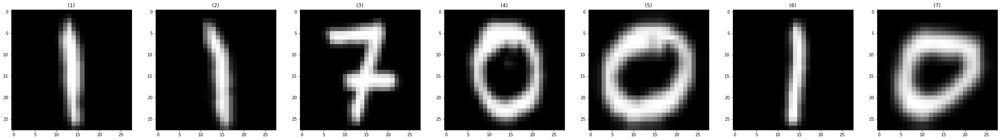

1170010


In [44]:
id_length = 7
show_info = True
img =  io.imread('solved_images/4.jpg')
image,_ = perspective_correction(img.copy())
image = image[image.shape[0]//16:image.shape[0]//4,image.shape[1]//2:]
image = removeShadow(image)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.medianBlur(gray, 5)

_,binary = cv2.threshold(gray,235,255,cv2.THRESH_BINARY)
contours,_ = cv2.findContours(binary,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

print("Number of contours:" + str(len(contours)))

data = []
data_cells=[]
data_tt=[]
for i,c in enumerate(contours):
    x,y,w,h = cv2.boundingRect(c)
    #if w > image.shape[0]/8 or h > image.shape[1]/8: #if very large contour 
    #    continue
    if w/h<0.8 or w/h>1.2: # if rec is not a square
        continue
    if cv2.contourArea(c) < 300: # if the square is so small
        continue

    cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)
    data.append((y,y+h,x,x+w))

print("Number of contours:" + str(len(data)))

id_str = id_length*'0'
if len(data) >= id_length:
    # To take the bigger 7 squares in the image, to avoid the logo's detection and digits
    data.sort(key=lambda x: (x[1]-x[0])*(x[3]-x[2]), reverse=True)
    data = data[:id_length]
    data.sort(key=lambda x: x[2]) #sorting rectangles from left to right
    ###

    for i,(y1,y2,x1,x2) in enumerate(data):
        im = resize(np.invert(binary[y1:y2,x1:x2].copy()),(32,32))
        im = im[2:-2,2:-2]
        data_tt.append(im) 
        data_cells.append(cropDigit(im,padding=2))

    id_str = ''
    for i in range(id_length):
        p = detect_digit(data_cells[i], plot=False)
        id_str += str(p)

if show_info: 
    plt.figure(figsize=(15, 15))
    plt.imshow(image)
    plt.title('image');

    show_images(data_cells)
    
print(id_str)


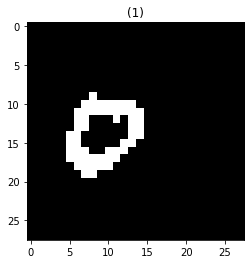

9 9 5 14


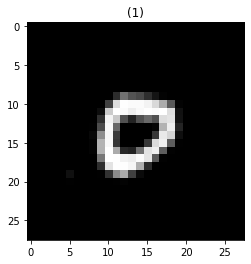

7 7 7 7


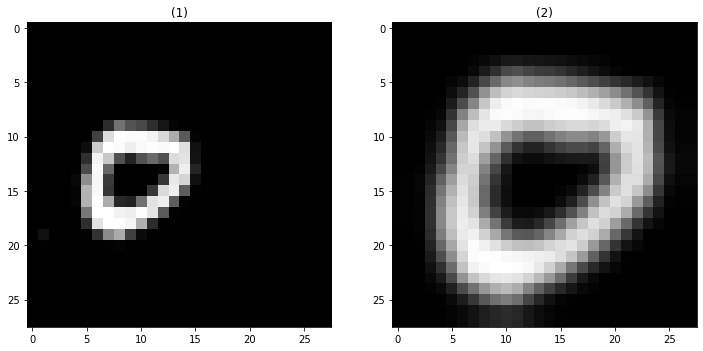

In [43]:
padding = 2

img = data_tt[-1]

im = img.copy()
im = im > 100/255
y,x = im.shape

show_images([im])

flag = False
for i in range(y):
    for j in range(x):
        if im[i][j]!=0:
            flag=True; break
    if flag: break
y_upper = i

flag = False
for i in range(y-1,0,-1):
    for j in range(x):
        if im[i][j]!=0:
            flag=True; break
    if flag: break
y_lower = y-i

flag = False
for j in range(x):
    for i in range(y):
        if im[i][j]!=0:
            flag=True; break
    if flag: break
x_left = j

flag = False
for j in range(x-1,0,-1):
    for i in range(y):
        if im[i][j]!=0:
            flag=True; break
    if flag: break
x_right = x-j

print(y_upper,y_upper, x_left, x_right)

maxy,miny = max(y_upper,y_lower), min(y_upper,y_lower)
maxy_i = 0 if y_upper>y_lower else 1
maxx,minx = max(x_left,x_right), min(x_left,x_right)
maxx_i = 0 if x_left>x_right else 1

im = img.copy()

shift_right = np.array([
[ 0, 0, 0],
[ 0, 0, 1],
[ 0, 0, 0]
])
shift_left = np.array([
[ 0, 0, 0],
[ 1, 0, 0],
[ 0, 0, 0]
])

if x_left > x_right:
    for _ in range((x_left-x_right)//2): 
        im = convolve2d(im, shift_left)
        im = im[1:-1,1:-1]
        x_left-=1
        x_right+=1
elif x_right > x_left:
    for _ in range((x_right-x_left)//2): 
        im = convolve2d(im, shift_right)
        im = im[1:-1,1:-1]
        x_left+=1
        x_right-=1
        
show_images([im])

x_left = (maxy+miny)//2
x_right = (maxy+miny)//2

y_upper = y_upper - padding if y_upper>padding else 0
y_lower = y_lower - padding if y_lower>padding else 1
x_left = x_left - padding if x_left>padding else 0
x_right = x_right - padding if x_right>padding else 1

print(y_upper,y_lower,x_left,x_right)

show_images([img, resize(im[y_upper:-y_lower,x_left:-x_right],(28,28))])

Number of contours:18
276 116 3 3
273 106 11 13
269 101 19 22
397 99 20 23
319 97 5 27
147 97 7 26
226 95 20 28
301 90 42 38
258 90 42 38
388 89 37 38
215 89 42 38
172 89 41 38
128 89 42 38
124 85 306 47
Number of contours:10
89 127 128 170
89 127 172 213
89 127 215 257
90 128 258 300
101 123 269 288
106 119 273 284
116 119 276 279
90 128 301 343
89 127 388 425
99 122 397 417


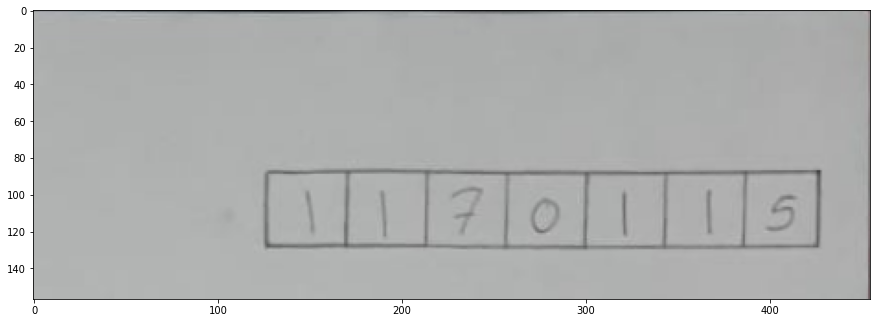

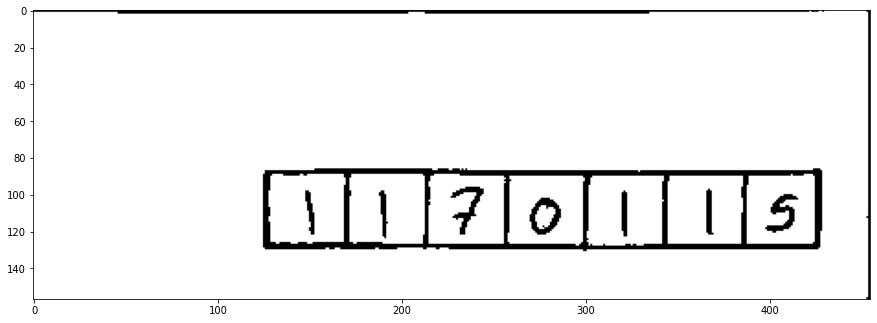

In [14]:
pap1 = pap[:pap.shape[0]//8,pap.shape[1]//2:]

plt.figure(figsize=(15, 15))
plt.imshow(pap1)

pap2 = removeShadow(pap1.copy())
#plt.figure(figsize=(15, 15))
#plt.imshow(pap2)

pap23 = cv2.cvtColor(pap2,cv2.COLOR_BGR2GRAY)
#plt.figure(figsize=(15, 15))
#plt.imshow(pap23)

pap3 = (pap23<240)*255
#plt.figure(figsize=(15, 15))
#plt.imshow(pap3)

ret,binary = cv2.threshold(pap23,240,255,cv2.THRESH_BINARY)

plt.figure(figsize=(15, 15))
plt.imshow(binary)

contours,hierarchy = cv2.findContours(binary,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

print("Number of contours:" + str(len(contours)))
data = []
data_i = []
contours2 = []
for i,c in enumerate(contours):
    x,y,w,h = cv2.boundingRect(c)
    print(x,y,w,h)
    #if w > image.shape[0]/8 or h > image.shape[1]/8: #if very large contour 
    #    continue
    if w/h<0.8 or w/h>1.2: # if rec is not a square
        contours.pop(i)
        i-=1
        continue
    
    #
    #img[y:y+h, x:x+w] = (255, 0, 0)
    data.append((y,y+h,x,x+w))
    contours2.append(c)

print("Number of contours:" + str(len(data)))

data.sort(key=lambda element: element[2])
#print(data)
for y1,y2,x1,x2 in data:
    print(y1,y2,x1,x2)
    data_i.append(image[y1:y2,x1:x2])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10


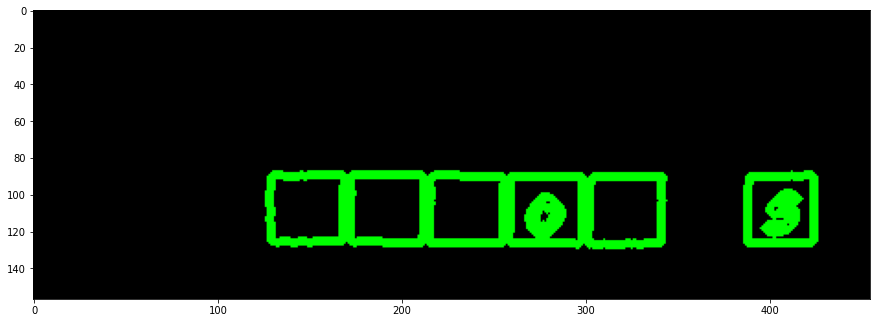

In [15]:
img_contours = np.zeros(pap1.shape)
# draw the contours on the empty image
tt = cv2.drawContours(img_contours, contours2, -1, (0,255,0), 3)
print(len(contours2))
plt.figure(figsize=(15, 15))
plt.imshow(tt)

Number of contours:61
Number of contours:7


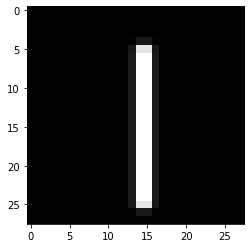

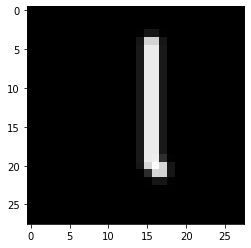

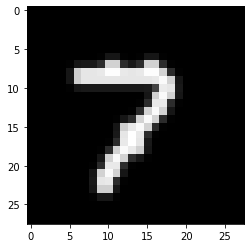

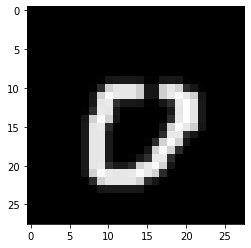

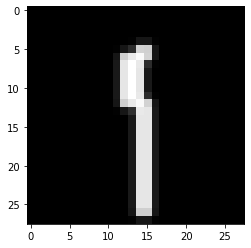

...

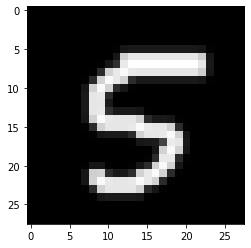

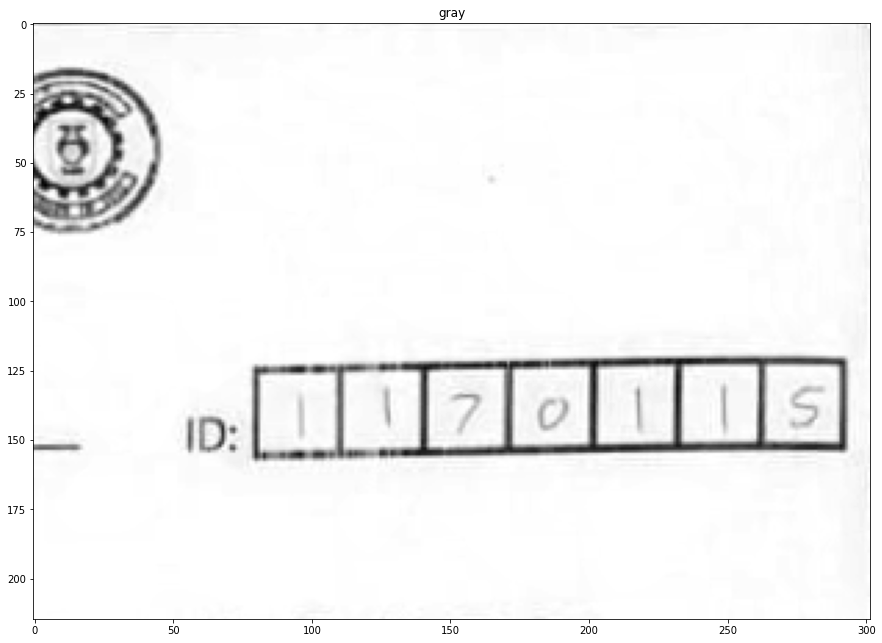

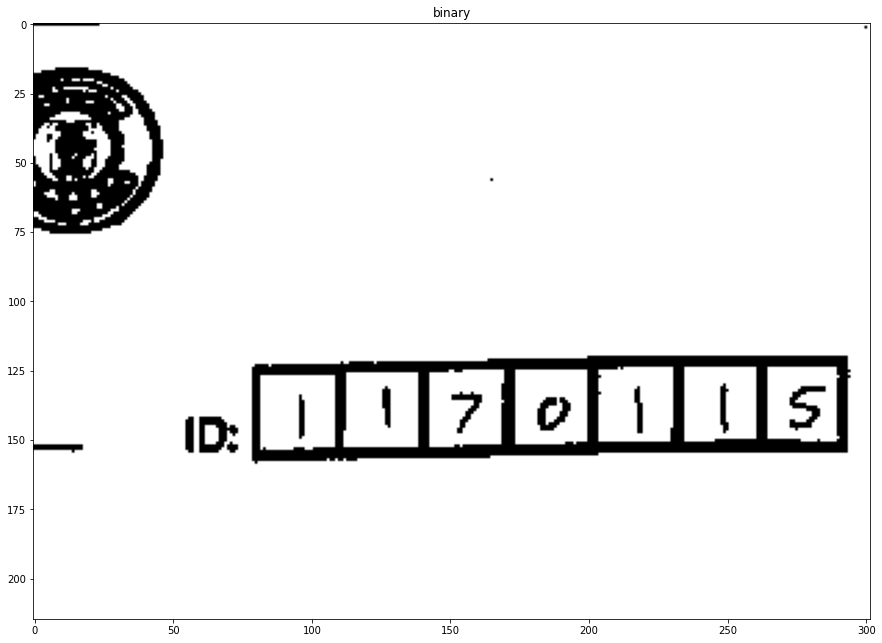

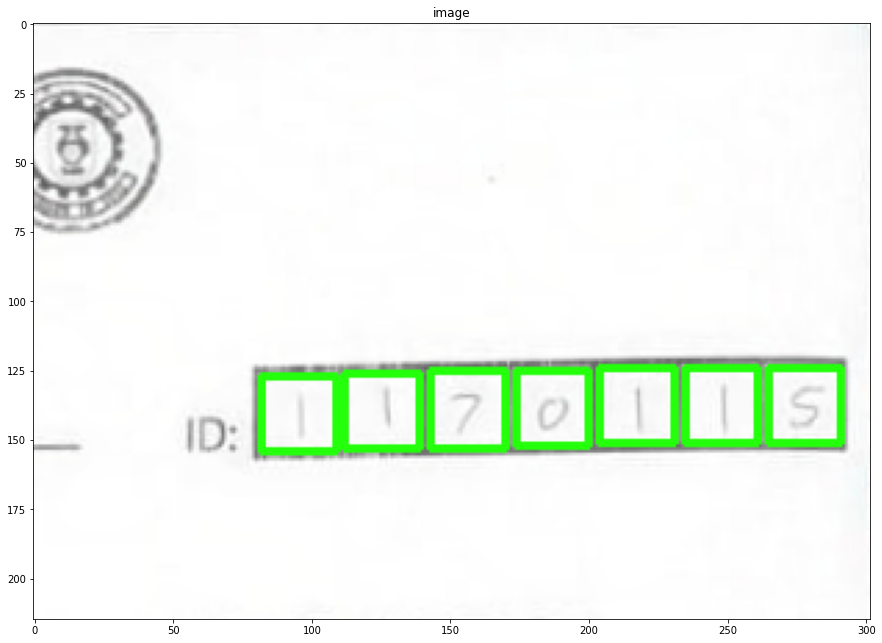

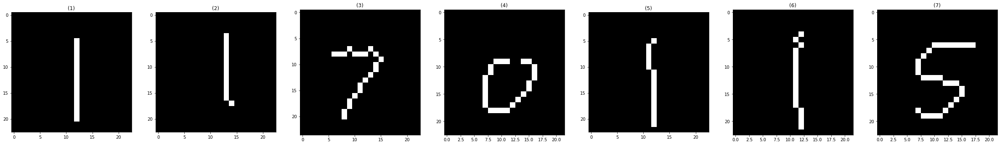

1170115


In [27]:
####### Main Test ########################
idd =  get_id(io.imread('44.jpeg'), id_length=7, show_info=True)
print(idd)

Number of contours:17
475 62 6 9
440 58 15 20
571 56 15 20
410 55 6 24
565 50 30 30
531 50 31 30
498 50 30 30
464 50 31 30
431 50 30 30
397 50 31 30
364 50 30 30
360 46 239 38
Number of contours:7
50 80 364 394
50 80 397 428
50 80 431 461
50 80 464 495
50 80 498 528
50 80 531 562
50 80 565 595


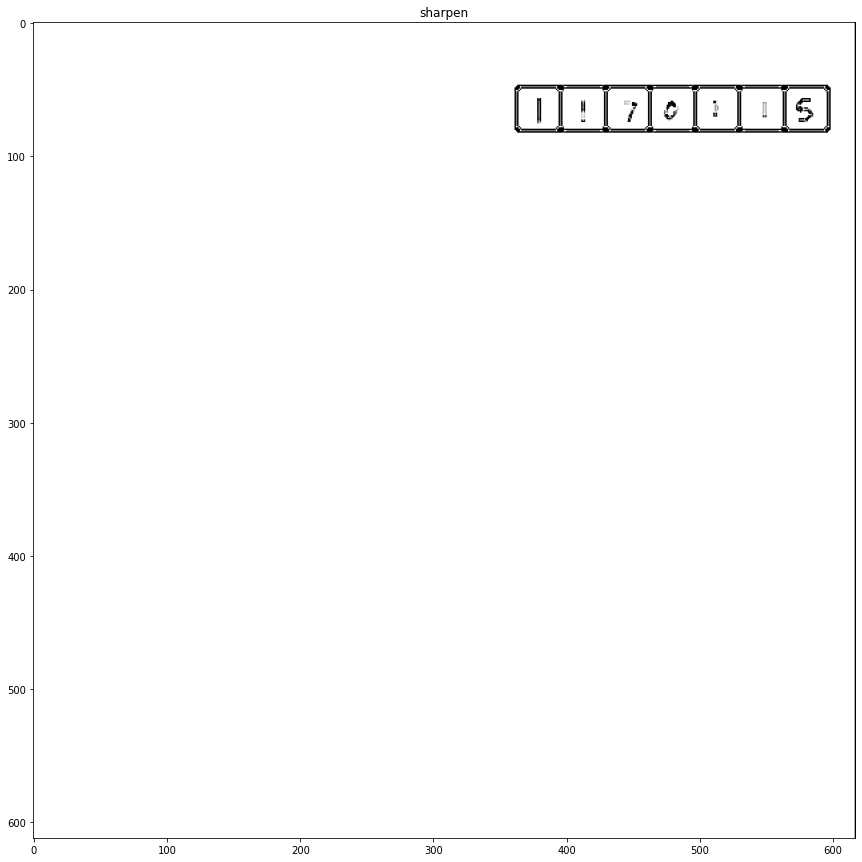

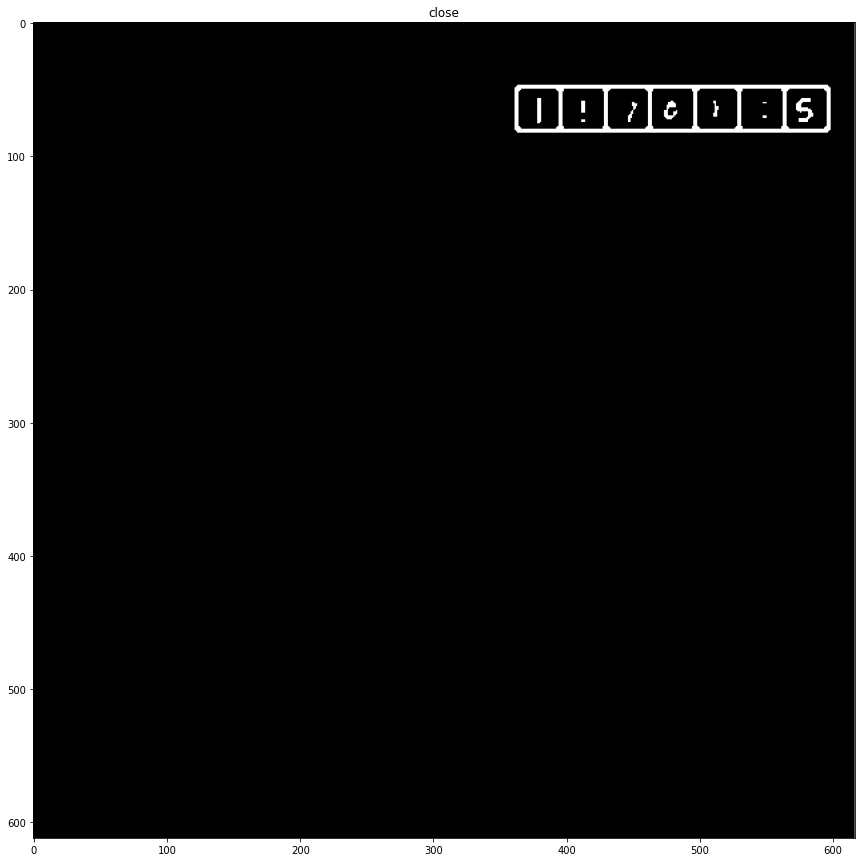

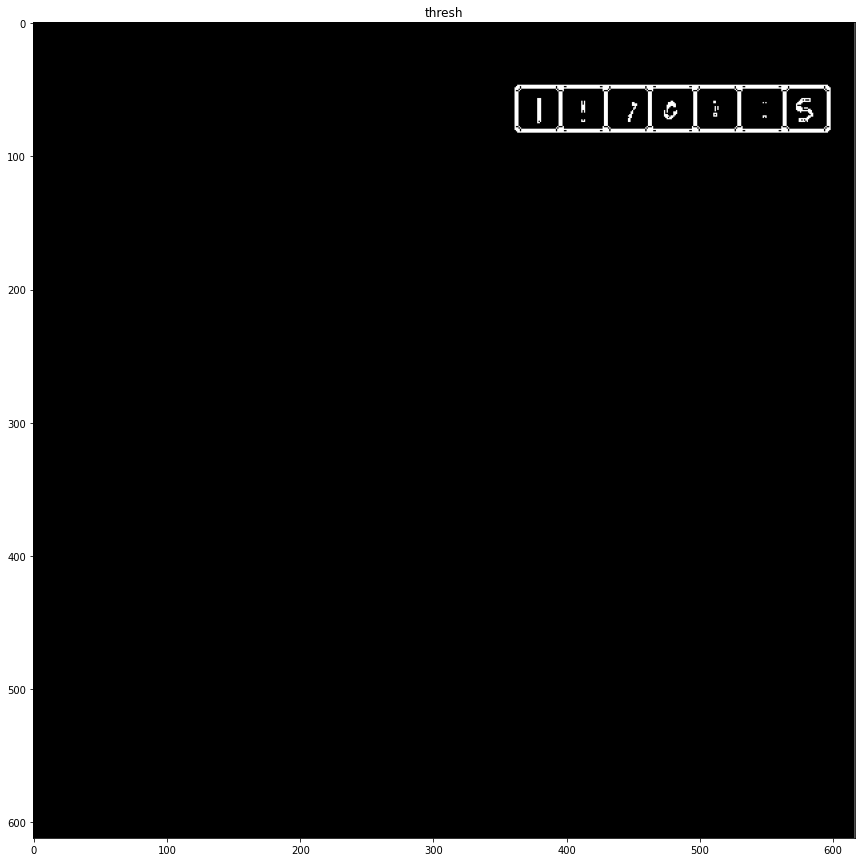

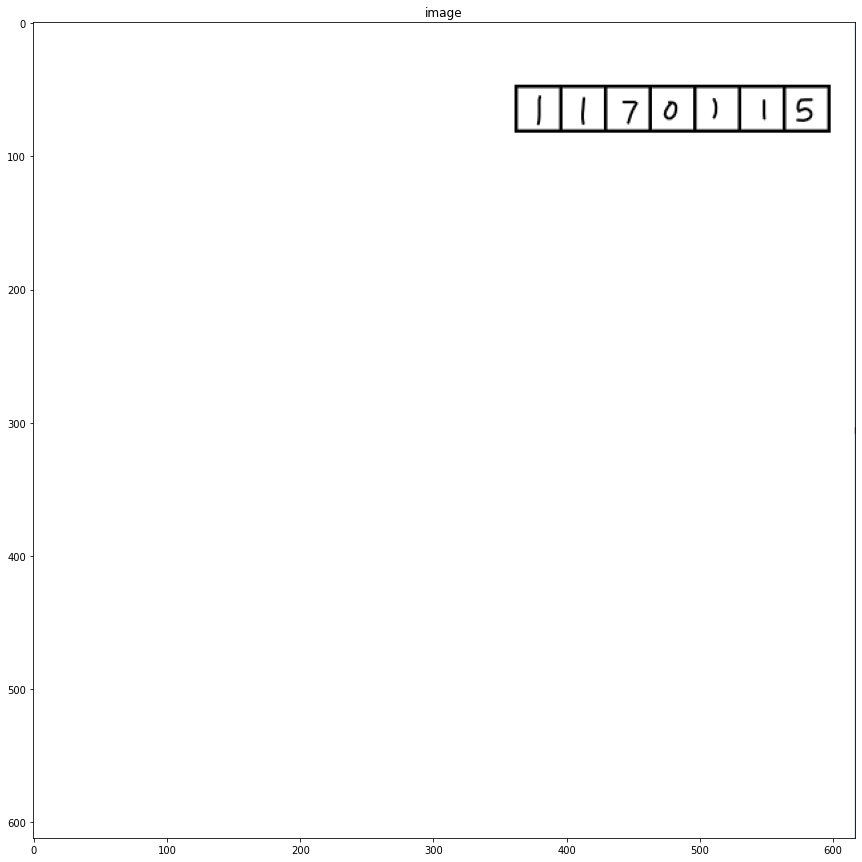

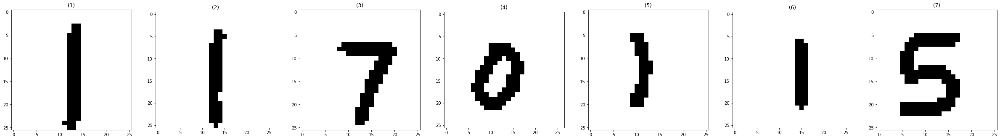

In [10]:
pap1 = io.imread('4.png')

image = pap1.copy()
image = removeShadow(image)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.medianBlur(gray, 5)


sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpen = cv2.filter2D(blur, -1, sharpen_kernel)

thresh = cv2.threshold(sharpen,160,255, cv2.THRESH_BINARY_INV)[1]
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)

ret,binary = cv2.threshold(gray,240,255,cv2.THRESH_BINARY)
contours,hierarchy = cv2.findContours(binary,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

print("Number of contours:" + str(len(contours)))
data = []
data_i = []
contours2 = []
for i,c in enumerate(contours):
    x,y,w,h = cv2.boundingRect(c)
    #cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)
    print(x,y,w,h)
    #if w > image.shape[0]/8 or h > image.shape[1]/8: #if very large contour 
    #    continue
    if w/h<0.8 or w/h>1.2: # if rec is not a square
        contours.pop(i)
        i-=1
        continue

    data.append((y,y+h,x,x+w))
    #cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)
    contours2.append(c)

print("Number of contours:" + str(len(data)))

data.sort(key=lambda element: element[2])
#print(data)
for y1,y2,x1,x2 in data:
    print(y1,y2,x1,x2)
    data_i.append(binary[y1+2:y2-2,x1+2:x2-2])

    
plt.figure(figsize=(15, 15))
plt.imshow(sharpen)
plt.title('sharpen')
plt.figure(figsize=(15, 15))
plt.imshow(close)
plt.title('close')
plt.figure(figsize=(15, 15))
plt.imshow(thresh)
plt.title('thresh')
plt.figure(figsize=(15, 15))
plt.imshow(image)
plt.title('image');

show_images(data_i)

Pridection:  8
Pridection:  8
Pridection:  7
Pridection:  8
Pridection:  8
Pridection:  1
Pridection:  5


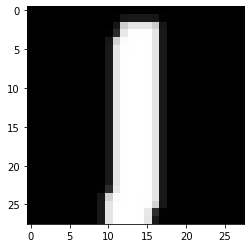

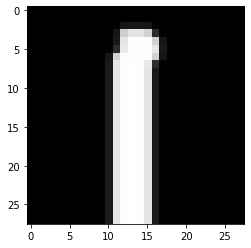

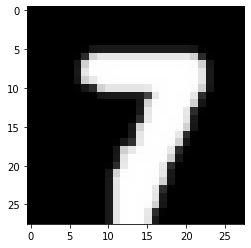

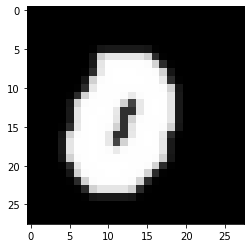

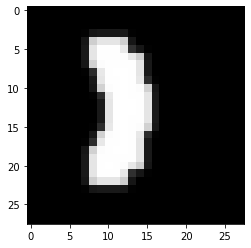

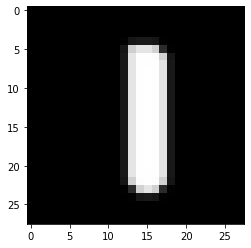

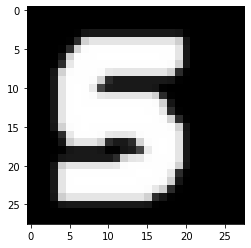

In [11]:
#for i in range(len(data_i)):
#    data_i[i] = resize(data_i[i], (114,114))
#    data_i[i] = cv2.medianBlur(data_i[i], 5)

for i in data_i:
    p = detect_digit(np.invert(i), plot=True)
    print('Pridection: ', p)